# Отток сотрудников

Задача кажется банальной, попробуем решить ее на разных датасетах и обсудим что получается и как применять построенные модели

датасеты
1. https://www.kaggle.com/datasets/kmldas/hr-employee-data-descriptive-analytics/data HR_Employee_Data.xlsx

и он же https://www.kaggle.com/datasets/mohamedjafirashraf/hr-data-analysis HR Data Analytics.xlsx

2. https://data.world/aaizemberg/hr-employee-attrition  WA_Fn-UseC_-HR-Employee-Attrition.tsv.txt

и его расширенная версия (а может просто случайно 30+ названий колонок совпало и число строк) https://www.kaggle.com/datasets/saadharoon27/hr-analytics-dataset HR_Analytics.csv


3. https://www.kaggle.com/datasets/rhuebner/human-resources-data-set/data   HRDataset_v14.csv

In [1]:
!pip install scikit-learn==1.4.2 shap lime pdpbox catboost hyperopt -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 53.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/35.8 MB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 57.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.1/121.1 kB 8.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cuml-cu12 25.6.0 requires scikit-learn>=1.5, but you have scikit-learn 1.4.2 which is incompatible.
umap-learn 0.5.9.post2 requires scikit-learn>=1.6, but you have scikit-learn 1.4.2 which is incompatible.


# Задача 1
[модифицированный датасет компании MNC](https://www.kaggle.com/datasets/kmldas/hr-employee-data-descriptive-analytics/data)

photo-1504384308090-c894fdcc538d.avif

In [2]:
import numpy as np
import pandas as pd
from numpy.random import RandomState
import hyperopt
from catboost import metrics, cv, Pool, CatBoostClassifier
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
from tabulate import tabulate
from sklearn.ensemble import RandomForestClassifier
import kagglehub
import os
import shap
from lime import lime_tabular

In [3]:
# Download latest version
path = kagglehub.dataset_download("kmldas/hr-employee-data-descriptive-analytics")
print("Path to dataset files:", path)
os.listdir(path)

Using Colab cache for faster access to the 'hr-employee-data-descriptive-analytics' dataset.
Path to dataset files: /kaggle/input/hr-employee-data-descriptive-analytics


['HR_Employee_Data.xlsx']

In [4]:
df = pd.read_excel(path + '/HR_Employee_Data.xlsx')
df.columns

Index(['Emp_Id', 'satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
       'promotion_last_5years', 'Department', 'salary'],
      dtype='object')

In [5]:
# похоже на таргет
df['left'].value_counts()

,count
left,
0,11428
1,3571


Очень большой event rate. Вероятность угадать случайно:

In [6]:
round(df[df['left'] == 1]['left'].count() / df.shape[0], 2)

np.float64(0.24)

24% ! изрядная текучка

In [7]:
df['satisfaction_level'].value_counts()

,count
satisfaction_level,
0.10,358
0.11,335
0.74,257
0.77,252
0.84,247
...,...
0.25,34
0.28,31
0.27,30


In [8]:
df.shape

(14999, 11)

satisfaction_level похож на данные опроса, но он здесь явно киллер фичей выступает

In [9]:
2 * roc_auc_score(df.left, df.satisfaction_level) -1

np.float64(-0.49587712513601034)

<Axes: >

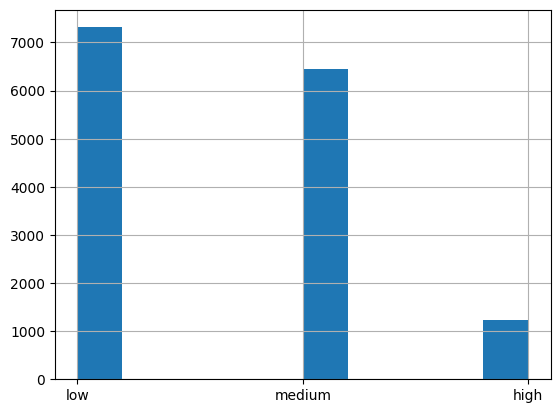

In [10]:
df.salary.hist()

<Axes: >

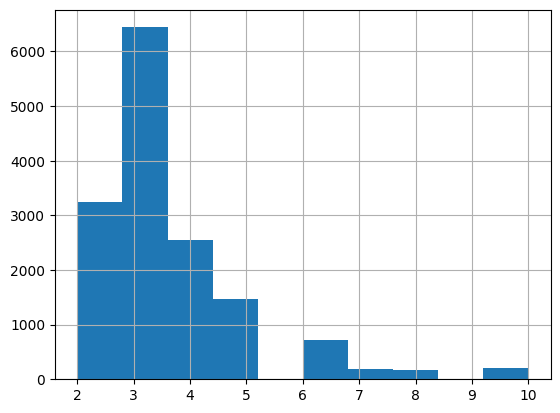

In [11]:
df.time_spend_company.hist()

<Axes: >

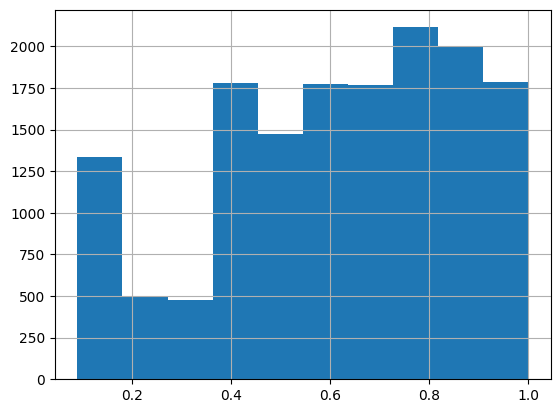

In [12]:
df.satisfaction_level.hist()

In [13]:
df['salary_code'] = df['salary'].map({'low' : 1, 'medium' : 2, 'high' : 3})
df[['time_spend_company', 'satisfaction_level', 'left', 'salary_code']].corr()

,time_spend_company,satisfaction_level,left,salary_code
time_spend_company,1.000000,-0.100866,0.144822,0.048715
satisfaction_level,-0.100866,1.000000,-0.388375,0.050022
left,0.144822,-0.388375,1.000000,-0.157898
salary_code,0.048715,0.050022,-0.157898,1.000000


In [14]:
df['strata'] = df.salary.astype(str) + '_' + df.Department.astype(str)
x = df.drop(['salary', 'Emp_Id', 'left'], axis = 1).copy()
y = df['left'].copy()
x_train, x_oos, y_train, y_oos = train_test_split(x, y, test_size=0.2, random_state=0, stratify = df[['strata']])
x_train.drop('strata', axis = 1, inplace = True)
x_oos.drop('strata', axis = 1, inplace = True)

In [15]:
(sum(y_oos) / len(y_oos) , sum(y_train) / len(y_train))

(0.22433333333333333, 0.2415201266772231)

Какая-то модель, пока даже параметры подбирать не будем

In [16]:
dep_woe = pd.crosstab(x_train['Department'],y_train, normalize='columns').assign(woe=lambda dfx: np.log(dfx[1] / dfx[0]))['woe']
dep_woe_dict = {}
deps = [x for x in x_train.Department.unique()]
for dep in deps:
  dep_woe_dict[dep] = dep_woe.loc[dep]
x_train['Department'] = x_train['Department'].map(dep_woe_dict)
x_oos['Department'] = x_oos['Department'].map(dep_woe_dict)

In [17]:
rf = RandomForestClassifier()
rf.fit(x_train, y_train)
2 * roc_auc_score(y_oos, rf.predict_proba(x_oos)[:, 1]) - 1

np.float64(0.9877655610760943)

In [18]:
print(tabulate([(x, y) for x, y in zip(rf.feature_names_in_, rf.feature_importances_)], headers = ['feature', 'importance']))

feature                  importance
---------------------  ------------
satisfaction_level      0.355615
last_evaluation         0.119743
number_project          0.167615
average_montly_hours    0.142542
time_spend_company      0.187142
Work_accident           0.00552212
promotion_last_5years   0.000901749
Department              0.0129841
salary_code             0.007935


c Gini 99 на тесте особо ничего не поделать в данном кейсе, к сожалению
Однако, прежде чем перейти к использованию, давайте посмотрим что будет с моделью без киллер фичи
а потом посмотрим насколько бизнес-ожидаемо модель интерпретирует фичи

In [19]:
rf.fit(x_train.drop('satisfaction_level', axis = 1), y_train)
2 * roc_auc_score(y_oos, rf.predict_proba(x_oos.drop('satisfaction_level', axis = 1))[:,1]) - 1

np.float64(0.9782302334951607)

In [20]:
from tabulate import tabulate
print(tabulate([(x, y) for x, y in zip(rf.feature_names_in_, rf.feature_importances_)], headers = ['feature', 'importance']))

feature                  importance
---------------------  ------------
last_evaluation          0.184188
number_project           0.27029
average_montly_hours     0.257761
time_spend_company       0.224343
Work_accident            0.0148354
promotion_last_5years    0.00257585
Department               0.0275275
salary_code              0.0184791


### немного pdp

In [21]:
from sklearn.inspection import PartialDependenceDisplay

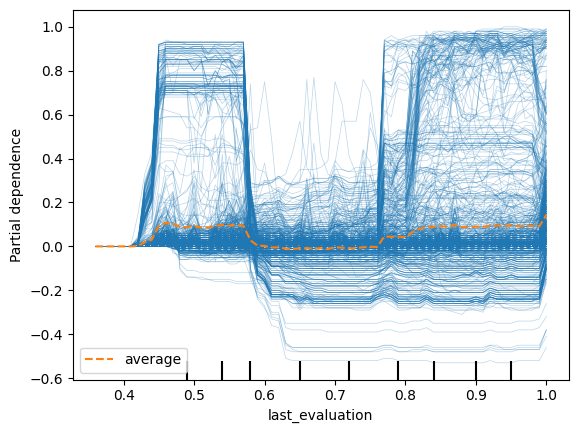

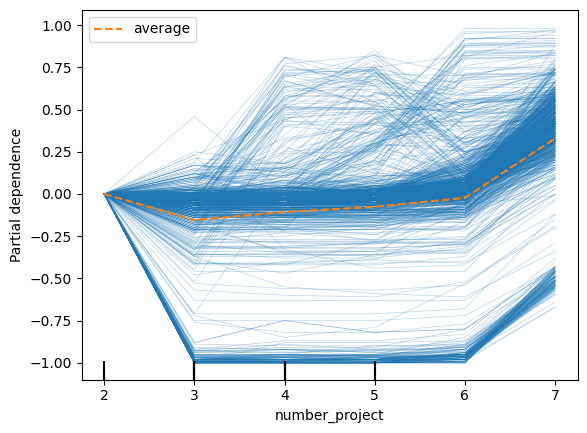

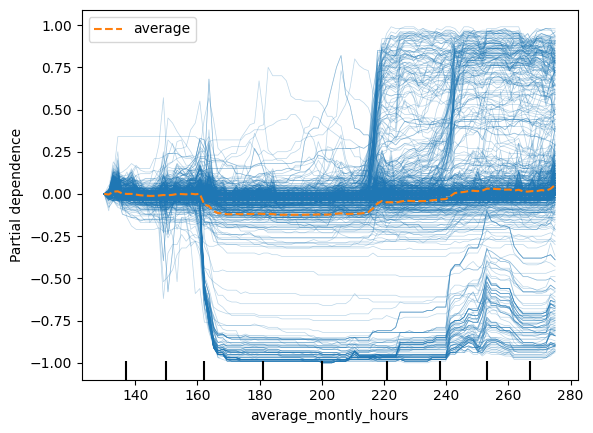

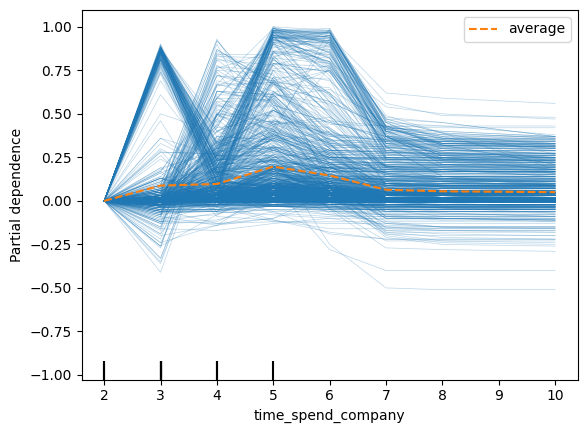

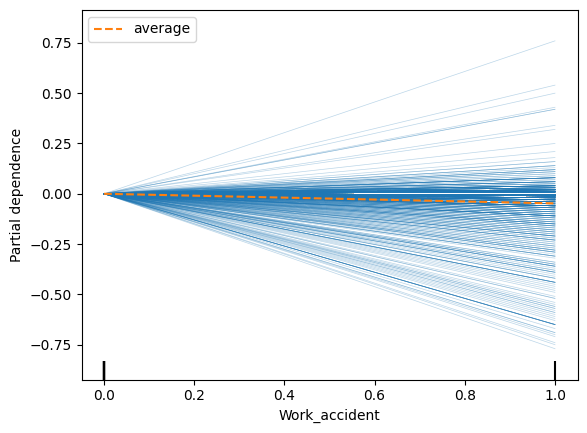

In [22]:
for k in range(5):
  PartialDependenceDisplay.from_estimator(rf, x_train.drop('satisfaction_level', axis = 1), [k], kind='both', centered=True)

вот не сказать что модель супер-предсказуема для бизнеса. Припаркуем на время вопрос и перейдем наконец к главному

In [23]:
preds = pd.concat([y_oos, pd.Series(data = rf.predict_proba(x_oos.drop('satisfaction_level', axis = 1))[:,1], index = y_oos.index, name = 'proba')
                                  , pd.Series(data = rf.predict(x_oos.drop('satisfaction_level', axis = 1)), index = y_oos.index, name = 'prediction')]
                                  , axis = 1)

Пример сценария использования модели -- отбирать 10% самых рисковых и передавать их начальнку начальника и HR BP

In [24]:
top_risk = preds.sort_values('proba', ascending = False).head(len(y_oos) // 10).copy()
top_risk[top_risk['left'] == top_risk['prediction']]['left'].count() / top_risk['left'].count()

np.float64(0.9966666666666667)

С таким датасетом ошибиться сложно, попробуем найти ситуацию похуже и попробуем оптимизировать нужную метрику

Но посмотрим еще раз на датасет, вернув киллер фичу.

## Фичи задача 1

In [25]:
rf = RandomForestClassifier()
rf.fit(x_train, y_train)
print(2 * roc_auc_score(y_oos, rf.predict_proba(x_oos)[:, 1]) - 1)
from tabulate import tabulate
print(tabulate(sorted([(x, y) for x, y in zip(rf.feature_names_in_, rf.feature_importances_)], key=lambda x: x[1], reverse=True), headers = ['feature', 'importance']))

0.9878191984910007
feature                  importance
---------------------  ------------
satisfaction_level      0.336487
number_project          0.184522
time_spend_company      0.180259
average_montly_hours    0.152844
last_evaluation         0.117697
Department              0.0131531
salary_code             0.00874455
Work_accident           0.00541864
promotion_last_5years   0.000874932


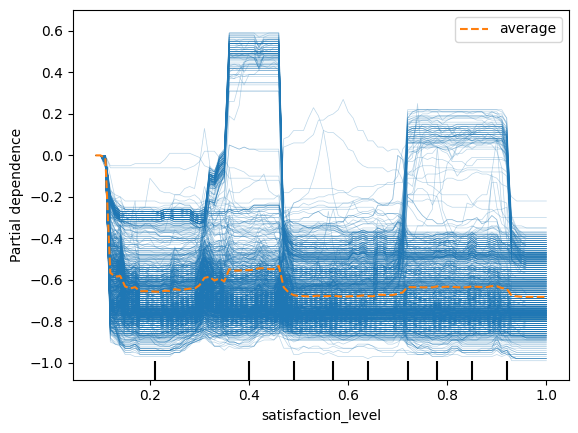

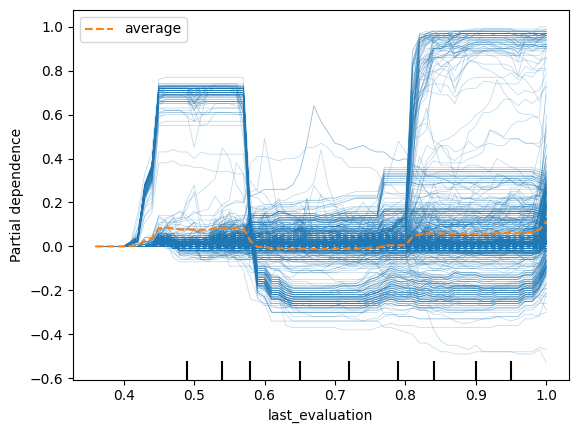

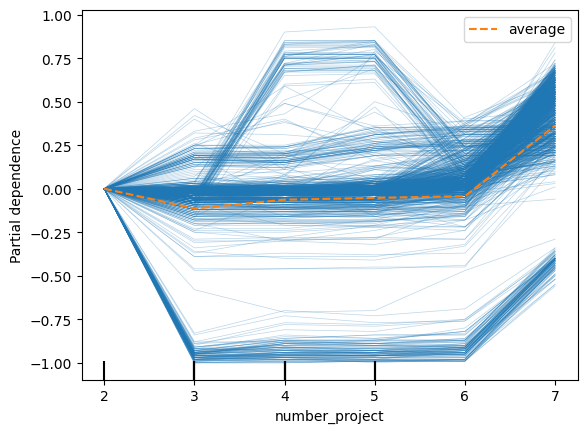

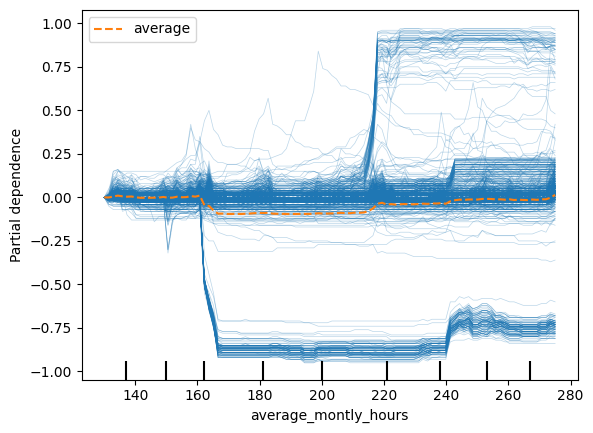

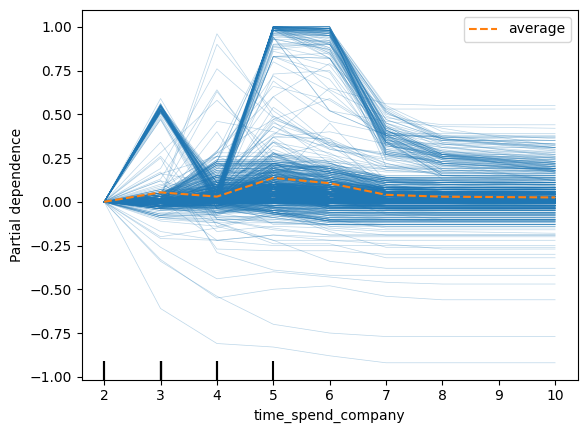

In [26]:
for k in range(5):
  PartialDependenceDisplay.from_estimator(rf, x_train, [k], kind='both', centered=True)

In [ ]:
preds = pd.concat([y_oos, pd.Series(data = rf.predict_proba(x_oos)[:,1], index = y_oos.index, name = 'proba')
                                  , pd.Series(data = rf.predict(x_oos), index = y_oos.index, name = 'prediction')]
                                  , axis = 1)
top_risk = preds.sort_values('proba', ascending = False).head(len(y_oos) // 10).copy()
top_risk[top_risk['left'] == top_risk['prediction']]['left'].count() / top_risk['left'].count()

## монотонность

Давайте сделаем модель похуже? Заставим ее быть монотонной по Satisfaction_level

In [ ]:
monotonic_cstr = np.zeros(len(x_train.columns))
monotonic_cstr[0] = 1
rf = RandomForestClassifier(monotonic_cst = monotonic_cstr)
rf.fit(x_train, y_train)
2 * roc_auc_score(y_oos, rf.predict_proba(x_oos)[:, 1]) - 1

In [ ]:
for k in range(5):
  PartialDependenceDisplay.from_estimator(rf, x_train, [k], kind='both', centered=True)

In [ ]:
preds = pd.concat([y_oos, pd.Series(data = rf.predict_proba(x_oos)[:,1], index = y_oos.index, name = 'proba')
                                  , pd.Series(data = rf.predict(x_oos), index = y_oos.index, name = 'prediction')]
                                  , axis = 1)
top_risk = preds.sort_values('proba', ascending = False).head(len(y_oos) // 10).copy()
top_risk[top_risk['left'] == top_risk['prediction']]['left'].count() / top_risk['left'].count()

Ничего не бывает бесплатно -- за монотонность мы заплатили точностью

### SHAP, LIME и покейсовая интерпретация

In [47]:
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(x_oos) #

In [48]:
# Визуализация SHAP для одного наблюдения
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[100][:,1], x_oos.iloc[0,:])

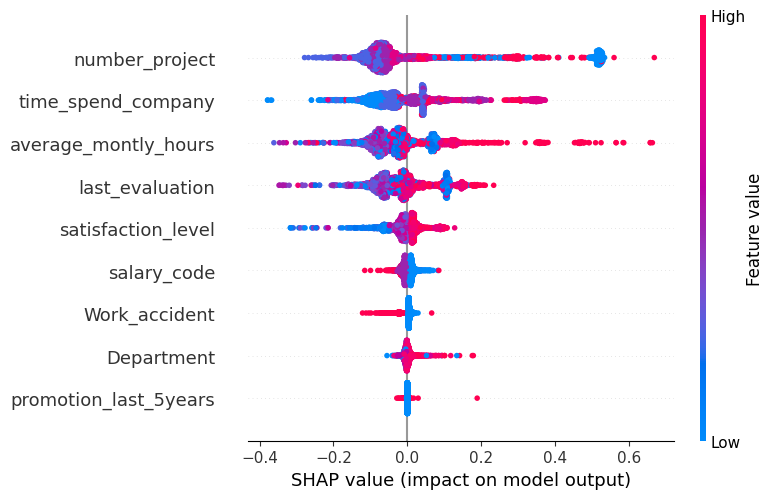

In [49]:
# Summary plot
shap.summary_plot(shap_values[:,:,1], x_oos)

In [50]:
# Интерпретация через LIME
explainer_lime = lime_tabular.LimeTabularExplainer(
    x_train.values,
    feature_names=x_train.columns,
    class_names=['No Churn', 'Churn'],
    mode='classification'
)

In [51]:
# Пример 1
exp = explainer_lime.explain_instance(x_oos.iloc[100].values, rf.predict_proba, num_features=10)
exp.show_in_notebook()

/usr/local/lib/python3.12/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [52]:
# Пример 2
exp = explainer_lime.explain_instance(x_oos.iloc[1].values, rf.predict_proba, num_features=10)
exp.show_in_notebook()

/usr/local/lib/python3.12/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


### Сравним shap и lime в одной точке

In [41]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[100][:,1], x_oos.iloc[100,:])

In [43]:
print(explainer.expected_value[1] + sum(shap_values[100][:,1]))

0.009895566524978416


In [44]:
exp = explainer_lime.explain_instance(x_oos.iloc[100].values, rf.predict_proba, num_features=10)
exp.show_in_notebook()

/usr/local/lib/python3.12/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [46]:
rf.predict_proba(x_oos)[100,1]

np.float64(0.009895566524978062)

### Теперь вернемся к PDP и ICE и попробуем понять почему они такие (деревянные модели намекают, но давайте проверим)

In [ ]:
monotonic_cstr = np.zeros(len(x_train.columns))
monotonic_cstr[0] = 1
rf = RandomForestClassifier(monotonic_cst = monotonic_cstr)
rf.fit(x_train, y_train)

RandomForestClassifier(monotonic_cst=array([1., 0., 0., 0., 0., 0., 0., 0., 0.]))

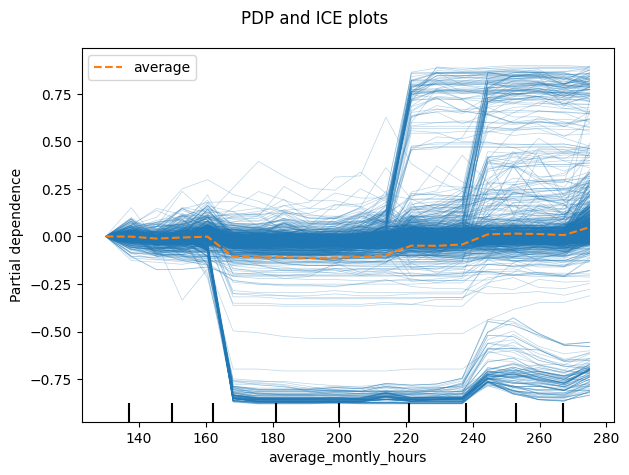

In [ ]:
import matplotlib.pyplot as plt
features = ['average_montly_hours']
pdp = PartialDependenceDisplay.from_estimator(
    rf
    , x_train
    , features
    , kind='both'  # PDP и ICE
    , grid_resolution=20
    , centered=True)
plt.suptitle('PDP and ICE plots')
plt.tight_layout()
plt.show()

In [ ]:
pdp.pd_results[0]['individual'][0].shape

(11999, 20)

In [ ]:
pdp_curves = pdp.pd_results[0]['individual'][0]  # Форма (n_samples, n_grid_points)
x_grid = pdp.pd_results[0]['grid_values'][0]  # Точки grid по оси X

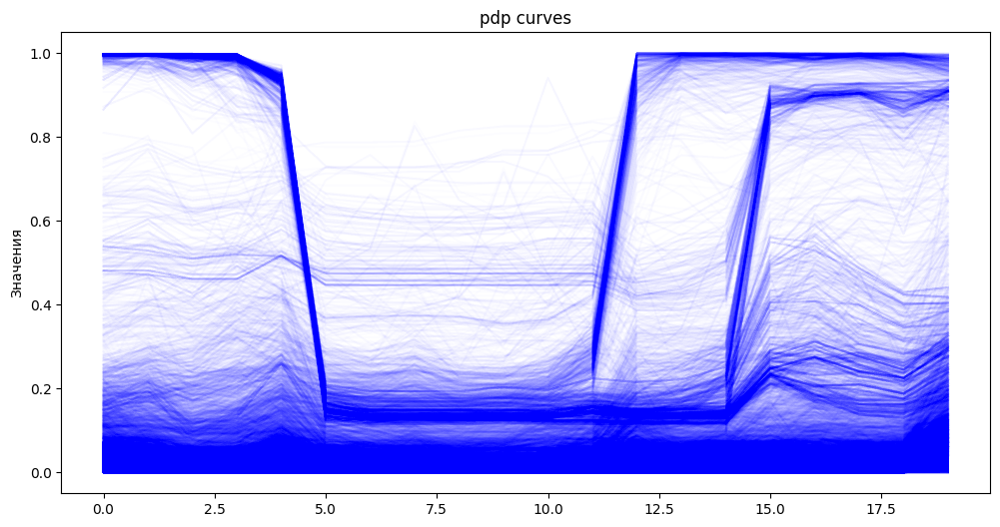

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

pdp_curves = pdp.pd_results[0]['individual'][0]

plt.figure(figsize=(12, 6))
for curve in pdp_curves:
    plt.plot(curve, color='blue', alpha=0.01)  # Сильная прозрачность

plt.title('pdp curves')
plt.ylabel('Значения')
plt.show()

In [ ]:
pdp_centered = pdp_curves.copy()

In [ ]:
for idx, curve in enumerate(pdp_centered):
  pdp_centered[idx, :] = pdp_centered[idx, :] - curve[0]

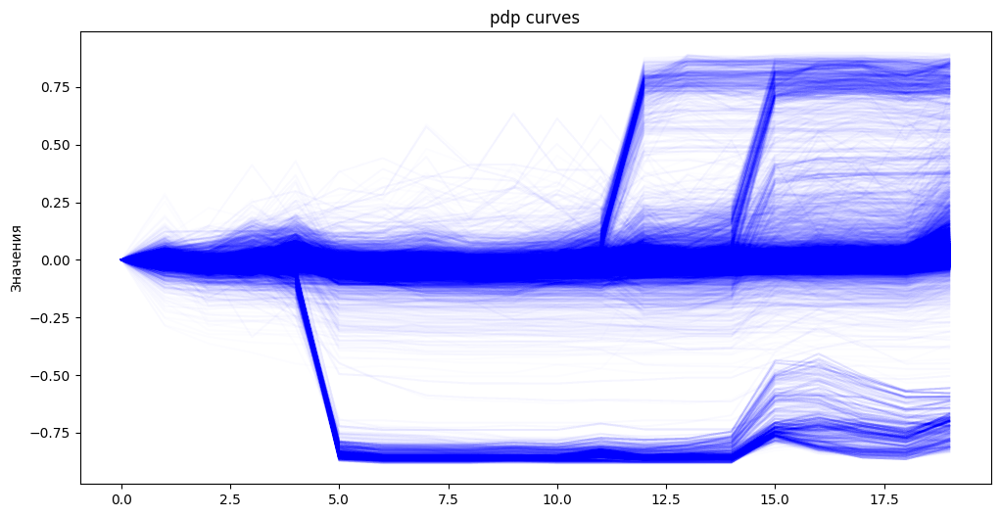

In [ ]:
plt.figure(figsize=(12, 6))
for curve in pdp_centered:
    plt.plot(curve, color='blue', alpha=0.01)  # Сильная прозрачность

plt.title('pdp curves')
plt.ylabel('Значения')
plt.show()

In [ ]:
!pip install tslearn -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 6.2 MB/s eta 0:00:00


In [ ]:
from tslearn.clustering import KShape, TimeSeriesKMeans
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import seaborn as sns
from scipy.spatial.distance import cdist
from sklearn.metrics import silhouette_score

In [ ]:
from itertools import product

In [ ]:
for with_normalization, method in product([True, False], ['kshape', 'dtw', 'euclidean']):
  if with_normalization:
    pdp_for_clustering = (pdp_centered - pdp_centered.mean(axis=1, keepdims=True)) / pdp_centered.std(axis=1, keepdims=True)
  else:
    pdp_for_clustering = pdp_centered
  if method == 'dtw':
    model = TimeSeriesKMeans(n_clusters=4, metric="dtw", random_state=42)
  elif method == 'kshape':
      model = KShape(n_clusters=4, random_state=42)
  else:
      model = KMeans(n_clusters=4, random_state=42)
  clusters = model.fit_predict(pdp_for_clustering)
  silhouette = silhouette_score(pdp_for_clustering, clusters)
  print(f"Silhouette Score: {silhouette:.2f}, with norm {with_normalization}, method {method} ")

Silhouette Score: 0.20, with norm True, method kshape 
Silhouette Score: 0.28, with norm True, method dtw 
Silhouette Score: 0.31, with norm True, method euclidean 
Silhouette Score: -0.19, with norm False, method kshape 
Silhouette Score: 0.65, with norm False, method dtw 
Silhouette Score: 0.79, with norm False, method euclidean 


In [ ]:
pdp_for_clustering = pdp_centered
model = KMeans(n_clusters=4, random_state=42)
clusters = model.fit_predict(pdp_for_clustering)
silhouette = silhouette_score(pdp_for_clustering, clusters)
print(f"Silhouette Score: {silhouette:.2f}, with norm False, method KMeans ")

Silhouette Score: 0.79, with norm False, method KMeans 


/usr/local/lib/python3.11/dist-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


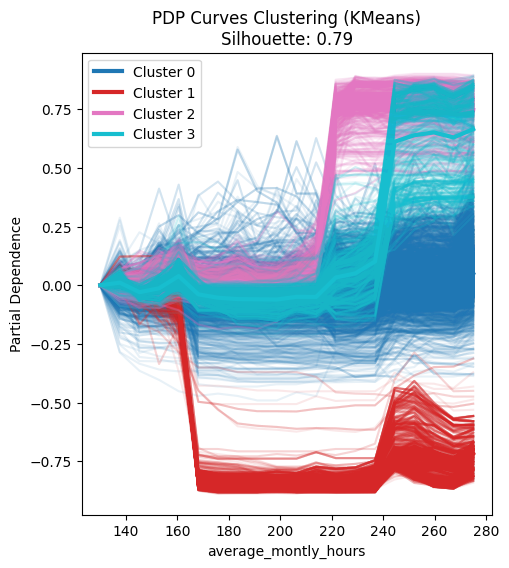

In [ ]:
plt.figure(figsize=(18, 6))
colors = plt.cm.tab10(np.linspace(0, 1, len(np.unique(clusters))))

# График 1: Кривые по кластерам
plt.subplot(1, 3, 1)
for cluster in np.unique(clusters):
    # Индивидуальные кривые
    for curve in pdp_centered[clusters == cluster]:
        plt.plot(x_grid, curve, color=colors[cluster], alpha=0.1)

    # Средняя кривая и доверительный интервал
    cluster_curves = pdp_centered[clusters == cluster]
    mean = np.mean(cluster_curves, axis=0)
    std = np.std(cluster_curves, axis=0)

    plt.plot(x_grid, mean, color=colors[cluster],
             linewidth=3, label=f'Cluster {cluster}')
    plt.fill_between(x_grid, mean - std, mean + std,
                    color=colors[cluster], alpha=0.2)

plt.xlabel('average_montly_hours')
plt.ylabel('Partial Dependence')
plt.title(f'PDP Curves Clustering (KMeans)\nSilhouette: {silhouette:.2f}')
plt.legend()

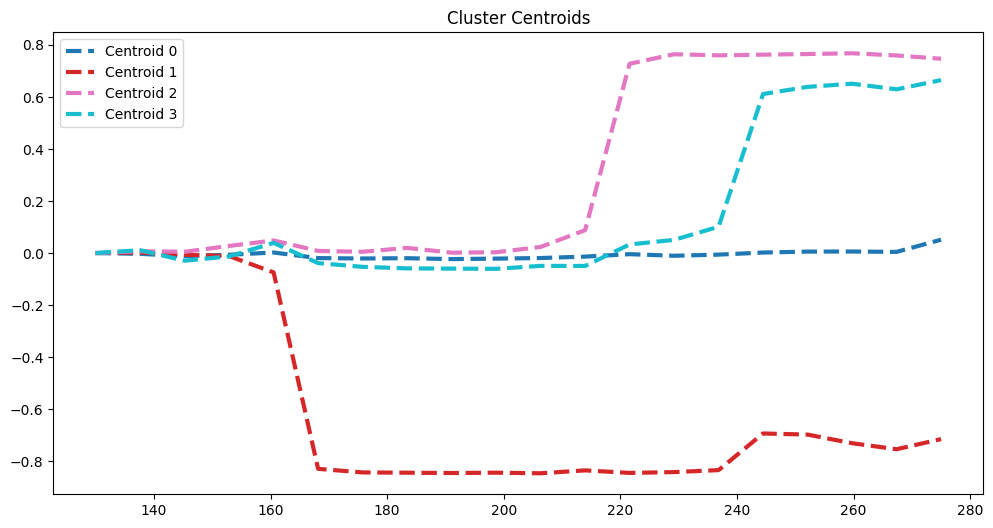

In [ ]:
# График 2: Centroids
plt.figure(figsize=(12, 6))
if hasattr(model, 'cluster_centers_'):
    for i, centroid in enumerate(model.cluster_centers_):
        plt.plot(x_grid, centroid, color=colors[i],
                 linewidth=3, linestyle='--', label=f'Centroid {i}')
plt.title('Cluster Centroids')
plt.legend()


### Ура! кластеризовали. Попробуем поинтерпретировать

In [ ]:
pd.Series(clusters).value_counts()

,count
0,9227
1,1297
3,743
2,732


In [ ]:
x_train['clusters'] = clusters

In [ ]:
x_train['is_1st_cluster'] = x_train['clusters'].apply(lambda x: 1 if x == 1 else 0)
x_train['is_1st_cluster'].value_counts()

,count
is_1st_cluster,
0,10702
1,1297


In [ ]:
x_train.drop('clusters', axis = 1, inplace = True)

In [ ]:
y_sm = x_train['is_1st_cluster']
x_tt, x_t_test, y_tt, y_t_test = train_test_split(x_train.drop('is_1st_cluster', axis = 1), y_sm, test_size=0.3, random_state=0, stratify = y_sm)

In [ ]:
  from sklearn.tree import DecisionTreeClassifier
  tree = DecisionTreeClassifier(max_depth=7)
  tree.fit(x_tt, y_tt)

DecisionTreeClassifier(max_depth=7)

In [ ]:
roc_auc_score(y_t_test, tree.predict_proba(x_t_test)[:,1])

np.float64(0.9982475087644577)

In [ ]:
from tabulate import tabulate
print(tabulate(sorted([(x, y) for x, y in zip(tree.feature_names_in_, tree.feature_importances_)], key=lambda x: x[1], reverse=True), headers = ['feature', 'importance']))

feature                  importance
---------------------  ------------
number_project           0.627332
satisfaction_level       0.241139
last_evaluation          0.106129
time_spend_company       0.0194102
average_montly_hours     0.00361628
Department               0.00154957
salary_code              0.00082321
Work_accident            0
promotion_last_5years    0


In [ ]:
explainer = shap.TreeExplainer(tree)
shap_values = explainer.shap_values(x_tt)

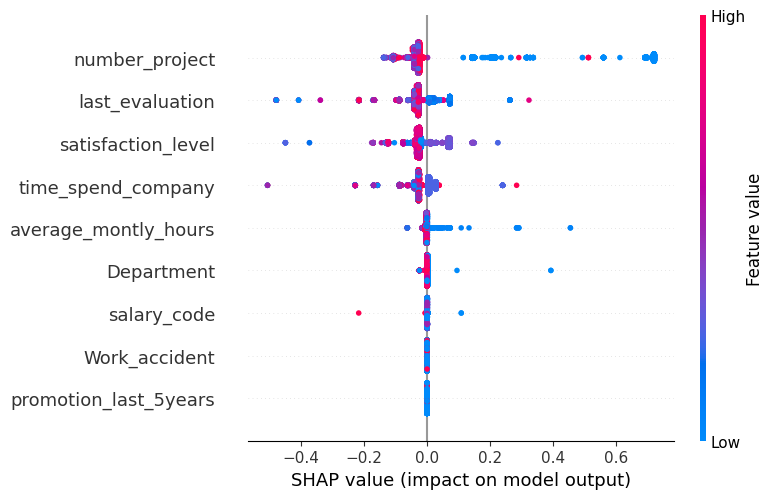

In [ ]:
shap.summary_plot(shap_values[:,:,1], x_tt)

In [ ]:
x_train[x_train['is_1st_cluster'] == 1]['number_project'].value_counts()

,count
number_project,
2,1291
6,4
4,2


### В любом расследовании главное не выйти на самих себя!

In [ ]:
x_train[x_train['is_1st_cluster'] == 1]['last_evaluation'].value_counts()

,count
last_evaluation,
0.46,127
0.51,116
0.54,115
0.48,108
0.50,107
0.56,105
0.57,100
0.47,96
0.55,95


# Задача 2 Отток с кастомной метрикой

In [ ]:
import kagglehub

# Download latest version
path2 = kagglehub.dataset_download("pavansubhasht/ibm-hr-analytics-attrition-dataset")

print("Path to dataset files:", path2)

Path to dataset files: /kaggle/input/ibm-hr-analytics-attrition-dataset


In [ ]:
os.listdir(path2)

['WA_Fn-UseC_-HR-Employee-Attrition.csv']

In [ ]:
df2 = pd.read_csv(path2 + '/WA_Fn-UseC_-HR-Employee-Attrition.csv')
# https://data.world/aaizemberg/hr-employee-attrition
df2.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [ ]:
# Target
df2.Attrition = df2.Attrition.map({'No' : 0, 'Yes' : 1})

In [ ]:
df2['EmployeeCount'].value_counts()

,count
EmployeeCount,
1,1470


In [ ]:
df2.drop('EmployeeCount', axis = 1, inplace = True)

In [ ]:
df2['Over18'].value_counts()

,count
Over18,
Y,1470


In [ ]:
df2.drop('Over18', axis = 1, inplace = True)

In [ ]:
df2.drop('EmployeeNumber', axis = 1, inplace = True)

In [ ]:
cat_features = ['Department', 'BusinessTravel', 'Gender', 'MaritalStatus', 'Education', 'EducationField', 'JobRole','OverTime']

In [ ]:
df2['StandardHours'].value_counts()

,count
StandardHours,
80,1470


In [ ]:
df2.drop('StandardHours', axis = 1, inplace = True)

In [ ]:
corr = df2.drop(cat_features, axis = 1).corr()
m = ~(corr.mask(np.eye(len(corr), dtype=bool)).abs() > 0.6).any()
raw = corr.loc[m, m]
raw

,Attrition,DailyRate,DistanceFromHome,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobSatisfaction,MonthlyRate,NumCompaniesWorked,RelationshipSatisfaction,StockOptionLevel,TrainingTimesLastYear,WorkLifeBalance
Attrition,1.000000,-0.056652,0.077924,-0.103369,-0.006846,-0.130016,-0.103481,0.015170,0.043494,-0.045872,-0.137145,-0.059478,-0.063939
DailyRate,-0.056652,1.000000,-0.004985,0.018355,0.023381,0.046135,0.030571,-0.032182,0.038153,0.007846,0.042143,0.002453,-0.037848
DistanceFromHome,0.077924,-0.004985,1.000000,-0.016075,0.031131,0.008783,-0.003669,0.027473,-0.029251,0.006557,0.044872,-0.036942,-0.026556
EnvironmentSatisfaction,-0.103369,0.018355,-0.016075,1.000000,-0.049857,-0.008278,-0.006784,0.037600,0.012594,0.007665,0.003432,-0.019359,0.027627
HourlyRate,-0.006846,0.023381,0.031131,-0.049857,1.000000,0.042861,-0.071335,-0.015297,0.022157,0.001330,0.050263,-0.008548,-0.004607
JobInvolvement,-0.130016,0.046135,0.008783,-0.008278,0.042861,1.000000,-0.021476,-0.016322,0.015012,0.034297,0.021523,-0.015338,-0.014617
JobSatisfaction,-0.103481,0.030571,-0.003669,-0.006784,-0.071335,-0.021476,1.000000,0.000644,-0.055699,-0.012454,0.010690,-0.005779,-0.019459
MonthlyRate,0.015170,-0.032182,0.027473,0.037600,-0.015297,-0.016322,0.000644,1.000000,0.017521,-0.004085,-0.034323,0.001467,0.007963
NumCompaniesWorked,0.043494,0.038153,-0.029251,0.012594,0.022157,0.015012,-0.055699,0.017521,1.000000,0.052733,0.030075,-0.066054,-0.008366
RelationshipSatisfaction,-0.045872,0.007846,0.006557,0.007665,0.001330,0.034297,-0.012454,-0.004085,0.052733,1.000000,-0.045952,0.002497,0.019604


In [ ]:
corr_features = set(df2.columns) - set(raw.columns)
corr_features

{'Age',
 'BusinessTravel',
 'Department',
 'Education',
 'EducationField',
 'Gender',
 'JobLevel',
 'JobRole',
 'MaritalStatus',
 'MonthlyIncome',
 'OverTime',
 'PercentSalaryHike',
 'PerformanceRating',
 'TotalWorkingYears',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager'}

Фичей много, данных мало. Фичи ожидаемо (по бизнес-смыслу) скоррелированы
Вариантов 3:

1.   дропнуть
2.   наинжинирить
3.   закрутить L2


In [ ]:
corr = df2.drop(cat_features, axis = 1).corr()
m = (corr.mask(np.eye(len(corr), dtype=bool)).abs() > 0.6).any()
raw = corr.loc[m, m]
raw

,Age,JobLevel,MonthlyIncome,PercentSalaryHike,PerformanceRating,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.509604,0.497855,0.003634,0.001904,0.680381,0.311309,0.212901,0.216513,0.202089
JobLevel,0.509604,1.000000,0.950300,-0.034730,-0.021222,0.782208,0.534739,0.389447,0.353885,0.375281
MonthlyIncome,0.497855,0.950300,1.000000,-0.027269,-0.017120,0.772893,0.514285,0.363818,0.344978,0.344079
PercentSalaryHike,0.003634,-0.034730,-0.027269,1.000000,0.773550,-0.020608,-0.035991,-0.001520,-0.022154,-0.011985
PerformanceRating,0.001904,-0.021222,-0.017120,0.773550,1.000000,0.006744,0.003435,0.034986,0.017896,0.022827
TotalWorkingYears,0.680381,0.782208,0.772893,-0.020608,0.006744,1.000000,0.628133,0.460365,0.404858,0.459188
YearsAtCompany,0.311309,0.534739,0.514285,-0.035991,0.003435,0.628133,1.000000,0.758754,0.618409,0.769212
YearsInCurrentRole,0.212901,0.389447,0.363818,-0.001520,0.034986,0.460365,0.758754,1.000000,0.548056,0.714365
YearsSinceLastPromotion,0.216513,0.353885,0.344978,-0.022154,0.017896,0.404858,0.618409,0.548056,1.000000,0.510224
YearsWithCurrManager,0.202089,0.375281,0.344079,-0.011985,0.022827,0.459188,0.769212,0.714365,0.510224,1.000000


In [ ]:
x = df2.drop('Attrition', axis = 1).copy()
y = df2['Attrition'].copy()
x_train, x_oos, y_train, y_oos = train_test_split(x, y, test_size=0.2, random_state=0, stratify = y)

In [ ]:
model = CatBoostClassifier(verbose=False, random_seed=42)
model.fit(x_train, y_train, cat_features = cat_features)
predictions = model.predict(x_oos)

In [ ]:
print(2 * roc_auc_score(y_oos, model.predict_proba(x_oos)[:,1]) - 1)
print(2 * roc_auc_score(y_train, model.predict_proba(x_train)[:,1]) - 1)

0.646481178396072
0.9813707697234975


### давайте еще и на OOF глянем

In [ ]:
from sklearn.model_selection import KFold
x_train2 = x_train.reset_index(drop=True).copy()
y_train2 = y_train.reset_index(drop=True).copy()
kf = KFold(n_splits=5)
predictions = []
for cv_train_idx, cv_test_idx in kf.split(x_train2):
  model = CatBoostClassifier(verbose=False, random_seed=42)
  model.fit(x_train2.iloc[cv_train_idx], y_train2.iloc[cv_train_idx], cat_features = cat_features)
  if len(predictions) == 0:
    predictions = pd.DataFrame(model.predict_proba(x_train2.iloc[cv_test_idx])[:,1], index = cv_test_idx)
  else:
    predictions = pd.concat([predictions, pd.DataFrame(model.predict_proba(x_train2.iloc[cv_test_idx])[:,1], index = cv_test_idx)])
print(2 * roc_auc_score(y_train2, predictions) - 1)

0.6448489377602222


## Значение нашей метрики еще ниже

In [ ]:
model = CatBoostClassifier(verbose=False, random_seed=42)
model.fit(x_train, y_train, cat_features = cat_features)
predictions = model.predict(x_oos)

In [ ]:
preds = pd.concat([y_oos, pd.Series(data = model.predict_proba(x_oos)[:, 1], index = y_oos.index, name = 'proba')
                          , pd.Series(data = model.predict(x_oos), index = y_oos.index, name = 'prediction')], axis = 1)
preds
top_risk = preds.sort_values('proba', ascending = False).head(len(y_oos) // 10).copy()

from sklearn.metrics import recall_score
print(recall_score(top_risk['Attrition'], top_risk['prediction'], pos_label=1))

0.2777777777777778


Катбуст переобучился (вроде нет) на 1176 точках и 30 фичах, еще и сильно скоррелированных? да не может быть).    
Плюс нам нужна специфическая метрика -- recall на топ-10% выборки.   

Что делаем:
- подбираем L2
- впихиваем кастомную метрику
- думаем, можно ли впихнуть кастомный лосс

[Кастомные лоссы и метрики катбуста](https://catboost.ai/en/docs/concepts/python-usages-examples)

In [ ]:
class Top10RecallMetric(object):
  # no weights!
    def is_max_optimal(self):
        # Returns whether great values of metric are better
        return True

    def evaluate(self, approxes, target, weight):
        # approxes is a list of indexed containers
        # (containers with only __len__ and __getitem__ defined),
        # one container per approx dimension.
        # Each container contains floats.
        # weight is a one dimensional indexed container.
        # target is a one dimensional indexed container.

        # weight parameter can be None.
        # Returns pair (error, weights sum)

        assert len(approxes) == 1
        assert len(target) == len(approxes[0])

        approx = approxes[0]

        top10recall_sum = 0.0
        weight_sum = 0.0
        x = []
        for i in range(len(approx)):
          x.append(approx[i])
          w = 1.0 if weight is None else weight[i]
          weight_sum += w

        x = sorted(x)
        const = x[round(len(x) * 9 // 10)]

        for i in range(len(approx)):
          if approx[i] > const:
            if target[i] == 1:
              top10recall_sum += 1 - abs(approx[i] - target[i])


        return top10recall_sum, weight_sum

    def get_final_error(self, error, weight):
        # Returns final value of metric based on error and weight
        return error / (weight + 1e-38)

In [ ]:
def hyperopt_objective(params):
    model = CatBoostClassifier(
        l2_leaf_reg=int(params['l2_leaf_reg']),
        learning_rate=params['learning_rate'],
        iterations=500,
        eval_metric=Top10RecallMetric(),
        random_seed=42,
        verbose=False,
        loss_function=metrics.Logloss(),
    )

    cv_data = cv(
        Pool(x_train, y_train, cat_features=cat_features),
        model.get_params(),
        logging_level='Silent',
    )
    best_accuracy = np.max(cv_data['test-Top10RecallMetric-mean'])

    return 1 - best_accuracy # as hyperopt minimises

In [ ]:
params_space = {
    'l2_leaf_reg': hyperopt.hp.qloguniform('l2_leaf_reg', 0, 2, 1),
    'learning_rate': hyperopt.hp.uniform('learning_rate', 1e-3, 5e-1),
}

trials = hyperopt.Trials()

best = hyperopt.fmin(
    hyperopt_objective,
    space=params_space,
    algo=hyperopt.tpe.suggest,
    max_evals=50,
    trials=trials,
    rstate=np.random.default_rng(123)
)

print(best)

100%|██████████| 50/50 [11:35<00:00, 13.90s/trial, best loss: 0.9837954392297157]
{'l2_leaf_reg': np.float64(7.0), 'learning_rate': np.float64(0.40753513729344043)}


In [ ]:
model = CatBoostClassifier(
    l2_leaf_reg=int(best['l2_leaf_reg']),
    learning_rate=best['learning_rate'],
    iterations=500,
    eval_metric=Top10RecallMetric(),
    random_seed=42,
    verbose=False,
    loss_function=metrics.Logloss(),
)
cv_data = cv(Pool(x_train, y_train, cat_features=cat_features), model.get_params())

Training on fold [0/3]

bestTest = 0.01892413674
bestIteration = 23

Training on fold [1/3]

bestTest = 0.01852137616
bestIteration = 22

Training on fold [2/3]

bestTest = 0.01909157942
bestIteration = 31



In [ ]:
print('Precise validation  score: {}'.format(np.max(cv_data['test-Top10RecallMetric-mean'])))

Precise validation  score: 0.016204560770284312


In [ ]:
model.fit(Pool(x_train, y_train, cat_features=cat_features))

In [ ]:
print(2 * roc_auc_score(y_oos, model.predict_proba(x_oos)[:,1]) - 1)

0.622361960547851


Стало вроде бы немного хуже

In [ ]:
preds = pd.concat([y_oos, pd.Series(data = model.predict_proba(x_oos)[:, 1], index = y_oos.index, name = 'proba')
                          , pd.Series(data = model.predict(x_oos), index = y_oos.index, name = 'prediction')], axis = 1)
top_risk = preds.sort_values('proba', ascending = False).head(len(y_oos) // 10).copy()
print(recall_score(top_risk['Attrition'], top_risk['prediction'], pos_label=1))

0.625


## Но целевая метрика здорово выросла!

Как наша модель работает глазами HR BP?

In [ ]:
er = df2['Attrition'].sum() / df2['Attrition'].count()
recall_top_10 = recall_score(top_risk['Attrition'], top_risk['prediction'], pos_label=1)
f"{er : 2.2f} vs {recall_top_10}"

' 0.16 vs 0.625'

In [ ]:
f'HR BP mode: модель угадывает в {recall_top_10 / er: 1.0f} раза лучше случайного'

'HR BP mode: модель угадывает в  4 раза лучше случайного'

In [ ]:
# значение метрики на трейне
preds = pd.concat([y_train, pd.Series(data = model.predict_proba(x_train)[:, 1], index = y_train.index, name = 'proba')
                          , pd.Series(data = model.predict(x_train), index = y_train.index, name = 'prediction')], axis = 1)
top_risk = preds.sort_values('proba', ascending = False).head(len(y_train) // 10).copy()
top_risk[(top_risk['Attrition'] == top_risk['prediction']) & (top_risk['Attrition'] == 1)]['Attrition'].count() / top_risk[top_risk['Attrition'] == 1]['Attrition'].count()

np.float64(1.0)

## Фичи задача 2

In [ ]:
print(tabulate(sorted([(x, y) for x, y in zip(x_train.columns, model.get_feature_importance())], key=lambda x: x[1], reverse=True), headers = ['feature', 'importance']))

feature                     importance
------------------------  ------------
OverTime                      7.45513
MonthlyIncome                 6.74239
JobRole                       5.19126
Age                           4.78218
MonthlyRate                   4.76067
DistanceFromHome              4.7602
DailyRate                     4.52307
JobSatisfaction               4.19313
HourlyRate                    4.04447
NumCompaniesWorked            3.8072
StockOptionLevel              3.80074
EducationField                3.65072
RelationshipSatisfaction      3.55177
MaritalStatus                 3.47092
BusinessTravel                3.4372
EnvironmentSatisfaction       3.3578
YearsSinceLastPromotion       3.23553
TotalWorkingYears             3.1645
TrainingTimesLastYear         3.15678
PercentSalaryHike             3.07204
YearsAtCompany                2.54169
YearsWithCurrManager          2.29207
JobInvolvement                2.16147
Department                    2.14705
WorkLifeBalance

# PS: LIME умеет в текстовые фичи

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn.datasets import fetch_20newsgroups

# Загрузка данных (новостные статьи)
categories = ['alt.atheism', 'soc.religion.christian']
newsgroups_train = fetch_20newsgroups(subset='train', categories=categories)
newsgroups_test = fetch_20newsgroups(subset='test', categories=categories)

# Создание пайплайна: TF-IDF + RandomForest
text_clf = make_pipeline(
    TfidfVectorizer(max_features=1000),
    RandomForestClassifier(n_estimators=50)
)

# Обучение модели
text_clf.fit(newsgroups_train.data, newsgroups_train.target)
print("Accuracy:", text_clf.score(newsgroups_test.data, newsgroups_test.target))

Accuracy: 0.9163179916317992


In [ ]:
from lime.lime_text import LimeTextExplainer

# Инициализация объяснителя
explainer = LimeTextExplainer(
    class_names=newsgroups_train.target_names,
    bow=False  # Используем TF-IDF веса вместо Bag-of-Words
)

# Выбираем случайный текст из тестовой выборки
idx = 49
text = newsgroups_test.data[idx]
true_label = newsgroups_test.target[idx]

# Генерируем объяснение
exp = explainer.explain_instance(
    text,
    text_clf.predict_proba,
    num_features=10,
    top_labels=1  # Объясняем только предсказанный класс
)

print(f"Текст:\n{text[:500]}...\n")
print(f"Истинный класс: {newsgroups_train.target_names[true_label]}")
print(f"Предсказанный класс: {newsgroups_train.target_names[text_clf.predict([text])[0]]}\n")

exp.show_in_notebook(text=True)

Текст:
From: marka@hcx1.ssd.csd.harris.com (Mark Ashley)
Subject: Marian Apparitions #1
Organization: Ft. Lauderdale, FL
Lines: 56

The Blessed Virgin Mary appeared to Catherine Laboure, a nun of the
sisters of Charity on July 18, 1830 at Rue du Bac, Paris.

Sister Catherine was awakened late that night by a small boy, age 5
or 6, who was literally glowing with some sort of interior light. 
The child led her to the sanctuary of the chapel where he promised
the Virgin Mary was to be found awaiting her. ...

Истинный класс: soc.religion.christian
Предсказанный класс: soc.religion.christian



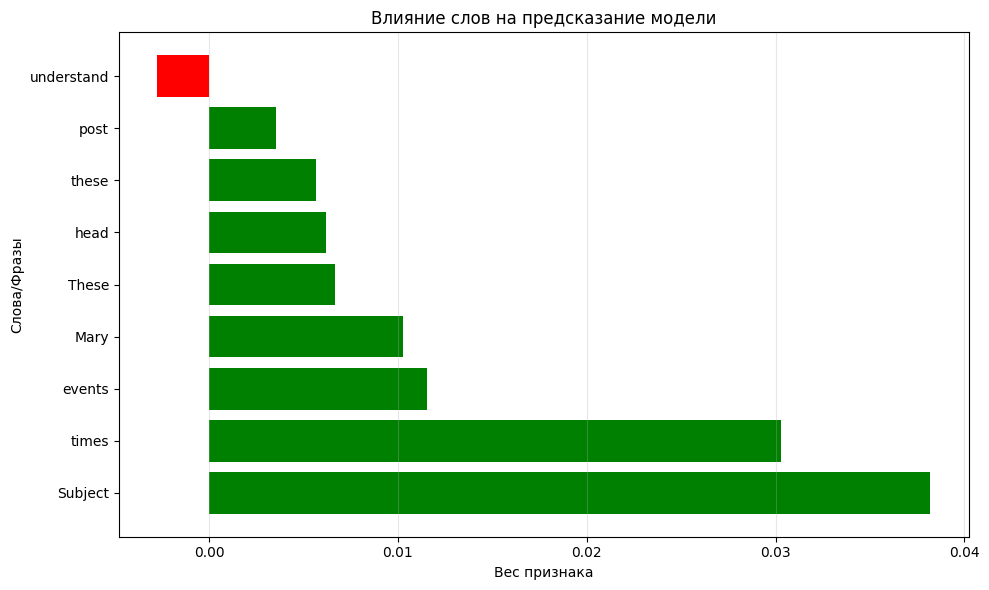

In [ ]:

explanation_data = exp.as_list(label=exp.available_labels()[0])
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
features = [x[0] for x in explanation_data]
scores = [x[1] for x in explanation_data]

colors = ['green' if x > 0 else 'red' for x in scores]
plt.barh(features, scores, color=colors)
plt.title('Влияние слов на предсказание модели')
plt.xlabel('Вес признака')
plt.ylabel('Слова/Фразы')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# ДЗ

Построить модель, которую можно


1.   объяснить бизнесу (PDP, ICE, etc)
2.   внедрить в прод

датасет [вот](https://www.kaggle.com/datasets/rhuebner/human-resources-data-set/data )



In [ ]:
import kagglehub

# Download latest version
path3 = kagglehub.dataset_download("rhuebner/human-resources-data-set")

print("Path to dataset files:", path3)

In [ ]:
df3 = pd.read_csv(path3 + '/HRDataset_v14.csv')
df3.columns

Index(['Employee_Name', 'EmpID', 'MarriedID', 'MaritalStatusID', 'GenderID',
       'EmpStatusID', 'DeptID', 'PerfScoreID', 'FromDiversityJobFairID',
       'Salary', 'Termd', 'PositionID', 'Position', 'State', 'Zip', 'DOB',
       'Sex', 'MaritalDesc', 'CitizenDesc', 'HispanicLatino', 'RaceDesc',
       'DateofHire', 'DateofTermination', 'TermReason', 'EmploymentStatus',
       'Department', 'ManagerName', 'ManagerID', 'RecruitmentSource',
       'PerformanceScore', 'EngagementSurvey', 'EmpSatisfaction',
       'SpecialProjectsCount', 'LastPerformanceReview_Date', 'DaysLateLast30',
       'Absences'],
      dtype='object')

In [ ]:
df3.shape

(311, 36)

In [ ]:
len(df3[df3['DateofTermination'].notna()]['DateofTermination'] ) / len(df3['DateofTermination'])

0.33440514469453375

Неплохой такой отток!

In [ ]:
# таргет
df3['left'] = df3['DateofTermination'].notna().map(int)